In [ ]:
pip install pyspark

###Census data is one of the largest sources of a variety of statistical information related to population. It typically includes information related to Age, Gender, Household composition, Employment Details, Accommodation Details, and so on. Till recent years, collecting census data has been a manual process involving field visits and registrations. Traditional database systems are inefficient at handling such data. This is where Big Data Technologies come into picture. As per a study by U.S. Census Bureau, analytics on census data could have been helpful during the Great Recession in various ways such as avoiding job loss in Supply-Chain businesses, reducing housing foreclosure rates,and so on.
###List of Attributes:
##•age: continuous
##•workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked
##•fnlwgt: continuous.
##•education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool
##•education-num: continuous
##•marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse
##•occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces
##•relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried
##•race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black
##•sex: Female, Male
##•capital-gain: continuous
##•capital-loss: continuous
##•hours-per-week: continuous
##•native-country:Country name
##•income: >50K, <=50

In [ ]:
import pandas as pd
import numpy as pd
from pyspark.sql import SparkSession

In [ ]:
#creating a sparksession to read the data
spark=SparkSession.builder.appName('Sparkproject').getOrCreate()

In [ ]:
#reading a data from given document files
census=spark.read.csv('censusdata.csv',header=True,inferSchema=True)

In [ ]:
census.show(n=3)

+---+----------------+------+------------+-------------+------------------+-------------+--------------+-----+------+------------+------------+--------------+--------------+------+
|age|       workclass|fnlwgt|   education|education.num|    marital.status|   occupation|  relationship| race|   sex|capital.gain|capital.loss|hours.per.week|native.country|income|
+---+----------------+------+------------+-------------+------------------+-------------+--------------+-----+------+------------+------------+--------------+--------------+------+
| 22|         Private|148187|        11th|            7|     Never-married|Other-service|Other-relative|White|  Male|           0|           0|            40| United-States| <=50K|
| 77|Self-emp-not-inc|138714|Some-college|           10|Married-civ-spouse|        Sales|       Husband|White|  Male|           0|           0|            40| United-States| <=50K|
| 47|               ?|224108|     HS-grad|            9|           Widowed|            ?|     U

In [ ]:
#reading the data types
census.dtypes

[('age', 'int'),
 ('workclass', 'string'),
 ('fnlwgt', 'int'),
 ('education', 'string'),
 ('education.num', 'int'),
 ('marital.status', 'string'),
 ('occupation', 'string'),
 ('relationship', 'string'),
 ('race', 'string'),
 ('sex', 'string'),
 ('capital.gain', 'int'),
 ('capital.loss', 'int'),
 ('hours.per.week', 'int'),
 ('native.country', 'string'),
 ('income', 'string')]

In [ ]:
#checking the schema
census.printSchema()

root
 |-- age: integer (nullable = true)
 |-- workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- education: string (nullable = true)
 |-- education.num: integer (nullable = true)
 |-- marital.status: string (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital.gain: integer (nullable = true)
 |-- capital.loss: integer (nullable = true)
 |-- hours.per.week: integer (nullable = true)
 |-- native.country: string (nullable = true)
 |-- income: string (nullable = true)



In [ ]:
census1=census.toDF(*(c.replace('.', '_') for c in census.columns))

In [ ]:
census1.columns

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education_num',
 'marital_status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital_gain',
 'capital_loss',
 'hours_per_week',
 'native_country',
 'income']

In [ ]:
census1.describe().show()

+-------+------------------+-----------+------------------+------------+------------------+--------------+----------------+------------+------------------+------+------------------+-----------------+------------------+--------------+------+
|summary|               age|  workclass|            fnlwgt|   education|     education_num|marital_status|      occupation|relationship|              race|   sex|      capital_gain|     capital_loss|    hours_per_week|native_country|income|
+-------+------------------+-----------+------------------+------------+------------------+--------------+----------------+------------+------------------+------+------------------+-----------------+------------------+--------------+------+
|  count|             92561|      92561|             92561|       92561|             92561|         92561|           92561|       92561|             92561| 92561|             92561|            92561|             92561|         92561| 92561|
|   mean|38.518069165199165|       n

In [ ]:
#Obtain the Unique values of Categorical Columns
cat_cols = ["workclass","education","marital_status","occupation","relationship","race","sex","native_country"]
for col in cat_cols:
    print(col+" unique values : "+str(census1.select(col).distinct().rdd.map(lambda x: x[0]).collect()))

workclass unique values : ['Self-emp-not-inc', 'Local-gov', 'State-gov', 'Private', 'Without-pay', 'Federal-gov', 'Never-worked', '?', 'Self-emp-inc']
education unique values : ['Masters', '10th', '5th-6th', 'Assoc-acdm', 'Assoc-voc', '7th-8th', '9th', 'HS-grad', 'Bachelors', '11th', '1st-4th', 'Preschool', '12th', 'Doctorate', 'Some-college', 'Prof-school']
marital_status unique values : ['Separated', 'Never-married', 'Married-spouse-absent', 'Divorced', 'Widowed', 'Married-AF-spouse', 'Married-civ-spouse']
occupation unique values : ['Sales', 'Exec-managerial', 'Prof-specialty', 'Handlers-cleaners', 'Farming-fishing', 'Craft-repair', 'Transport-moving', 'Priv-house-serv', 'Protective-serv', 'Other-service', 'Tech-support', 'Machine-op-inspct', 'Armed-Forces', '?', 'Adm-clerical']
relationship unique values : ['Own-child', 'Not-in-family', 'Unmarried', 'Wife', 'Other-relative', 'Husband']
race unique values : ['Other', 'Amer-Indian-Eskimo', 'White', 'Asian-Pac-Islander', 'Black']
sex 

In [ ]:
#Remove unwanted values if present in any of the columns (numerical as well as categorical columns)
all_column = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income']

for c in all_column:
  print(c,census1.filter(census1[c].isNull()).count())

age 0
workclass 0
fnlwgt 0
education 0
education_num 0
marital_status 0
occupation 0
relationship 0
race 0
sex 0
capital_gain 0
capital_loss 0
hours_per_week 0
native_country 0
income 0


In [ ]:
#remove the null or nan values if there is any
census1.na.drop().show(n=5)

+---+----------------+------+------------+-------------+------------------+---------------+--------------+-----+------+------------+------------+--------------+--------------+------+
|age|       workclass|fnlwgt|   education|education_num|    marital_status|     occupation|  relationship| race|   sex|capital_gain|capital_loss|hours_per_week|native_country|income|
+---+----------------+------+------------+-------------+------------------+---------------+--------------+-----+------+------------+------------+--------------+--------------+------+
| 22|         Private|148187|        11th|            7|     Never-married|  Other-service|Other-relative|White|  Male|           0|           0|            40| United-States| <=50K|
| 77|Self-emp-not-inc|138714|Some-college|           10|Married-civ-spouse|          Sales|       Husband|White|  Male|           0|           0|            40| United-States| <=50K|
| 47|               ?|224108|     HS-grad|            9|           Widowed|          

In [ ]:
#Obtain the relationship between different columns using covariance which shows the degree of interdependence of the two columns
census1.stat.corr("capital_gain","hours_per_week")

0.0761381495800006

In [ ]:
census1.stat.corr("age","hours_per_week")

0.07371862498450084

In [ ]:
census1.stat.corr("capital_gain","age")

0.07473496895024166

In [ ]:
census1.stat.corr("capital_gain","capital_loss")

-0.0315137368452845

In [ ]:
#getting count of distinct element
for i in cat_cols :
  print(census1.select(i).groupby(i).count().show())

+----------------+-----+
|       workclass|count|
+----------------+-----+
|Self-emp-not-inc| 7266|
|       Local-gov| 5903|
|       State-gov| 3663|
|         Private|64746|
|     Without-pay|   38|
|     Federal-gov| 2704|
|    Never-worked|   22|
|               ?| 5070|
|    Self-emp-inc| 3149|
+----------------+-----+

None
+------------+-----+
|   education|count|
+------------+-----+
|     Masters| 4909|
|        10th| 2608|
|     5th-6th|  950|
|  Assoc-acdm| 2931|
|   Assoc-voc| 3974|
|     7th-8th| 1849|
|         9th| 1460|
|     HS-grad|29864|
|   Bachelors|15282|
|        11th| 3424|
|     1st-4th|  493|
|   Preschool|  140|
|        12th| 1253|
|   Doctorate| 1143|
|Some-college|20659|
| Prof-school| 1622|
+------------+-----+

None
+--------------------+-----+
|      marital_status|count|
+--------------------+-----+
|           Separated| 3009|
|       Never-married|30614|
|Married-spouse-ab...| 1191|
|            Divorced|12385|
|             Widowed| 2807|
|   Married

In [ ]:
#Create a crosstab on two different columns (example, age & workclass)
census1.crosstab("workclass","age").toPandas()

,workclass_age,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,90
0,Self-emp-not-inc,22,41,44,33,35,40,40,61,70,90,93,143,144,149,139,141,200,193,220,219,225,218,183,170,205,270,220,185,183,140,213,176,148,185,208,132,118,150,165,147,142,136,125,131,100,98,112,80,57,59,78,47,38,33,28,18,42,33,29,26,13,10,8,22,13,6,2,3,3,0,0,7,9
1,State-gov,7,28,53,63,82,75,84,85,67,78,80,85,88,80,112,110,94,108,79,132,95,100,91,117,102,102,159,89,105,110,84,69,99,69,53,45,73,57,57,35,41,39,39,43,18,28,10,36,13,10,14,9,24,3,10,0,5,13,3,0,0,0,0,0,4,0,0,0,0,0,0,0,0
2,Local-gov,36,24,23,36,28,55,101,101,123,140,144,142,119,162,139,120,142,159,112,175,174,155,150,151,219,216,192,190,179,171,170,80,166,158,167,122,138,100,96,72,78,77,89,60,60,66,30,50,44,38,31,17,16,11,13,4,20,0,3,19,4,2,5,1,0,0,0,7,0,0,0,0,11
3,Without-pay,0,0,5,0,2,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,3,0,0,6,0,2,4,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Federal-gov,2,11,16,26,4,30,38,37,22,38,37,48,72,52,56,78,75,65,63,78,81,75,93,79,79,80,108,86,82,118,117,65,67,67,83,68,67,31,42,39,52,39,47,34,29,15,17,33,7,5,7,6,3,2,6,8,3,5,0,3,0,0,4,0,0,0,0,0,0,0,0,0,4
5,?,163,270,311,321,251,221,131,96,102,66,90,102,74,71,49,69,73,77,79,69,23,42,30,49,52,39,34,30,27,27,39,48,47,46,48,39,33,47,63,36,48,65,48,87,95,105,109,86,109,100,92,67,80,66,39,72,34,35,28,56,26,26,18,16,23,18,3,7,0,0,3,0,25
6,Never-worked,2,11,0,3,0,0,3,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Private,888,1204,1573,1627,1642,1750,2147,1879,2008,1805,1917,1896,1742,1932,1986,1745,1831,1796,1806,1905,1716,1673,1652,1588,1550,1417,1419,1364,1401,1414,1267,1035,995,1085,1082,862,845,708,712,660,568,613,602,493,469,385,330,265,244,191,150,141,128,92,72,73,71,45,37,41,26,21,13,22,16,15,2,10,4,5,0,1,77
8,Self-emp-inc,14,23,8,7,2,15,14,13,35,27,42,35,40,62,50,66,47,62,57,71,87,66,115,96,117,70,98,110,115,107,92,91,91,123,100,67,67,70,46,59,76,76,49,54,51,37,34,36,43,32,37,15,12,29,13,4,7,10,11,1,10,9,11,0,2,6,6,1,0,0,0,0,0


In [ ]:
#Create a crosstab on two different columns (example, age & occupation)
census1.crosstab("occupation","age").toPandas()

,occupation_age,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,90
0,Sales,262,324,313,299,293,319,353,305,239,251,278,227,247,300,261,244,259,234,301,249,163,249,218,170,265,234,233,193,175,225,221,131,151,209,175,164,121,162,109,122,120,129,109,93,101,90,82,45,68,79,42,50,30,17,18,13,17,16,14,6,8,5,14,0,6,4,2,1,5,0,0,0,6
1,Craft-repair,49,55,121,105,175,191,235,264,279,312,309,302,330,390,416,370,356,382,418,403,428,434,307,311,344,297,299,261,293,246,277,217,235,278,249,185,199,155,141,163,135,129,148,133,71,62,66,70,27,36,11,5,13,7,20,2,3,5,11,11,2,6,0,1,0,2,0,0,0,0,0,0,9
2,Other-service,371,463,503,391,410,288,359,251,255,204,211,229,228,182,284,194,248,204,271,202,261,217,156,196,138,133,122,141,157,123,190,123,139,94,91,108,99,102,87,99,111,85,83,87,85,74,55,51,41,35,35,32,20,24,17,25,27,19,3,18,3,6,2,8,4,4,0,2,0,0,0,0,19
3,Tech-support,3,7,17,37,43,66,90,79,117,62,113,90,98,84,87,91,65,66,63,84,92,53,52,86,84,87,67,75,46,83,42,34,22,68,60,27,34,36,43,20,32,8,23,24,13,16,7,16,4,6,3,0,4,11,3,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Prof-specialty,31,27,47,75,91,141,219,217,274,289,259,324,324,353,289,307,377,374,250,421,296,316,350,399,409,414,389,342,356,338,309,226,274,288,277,155,200,132,168,126,135,132,124,109,82,101,76,76,36,43,43,35,27,18,12,15,29,22,14,9,1,0,11,11,8,0,0,8,0,0,0,3,11
5,Protective-serv,9,14,10,21,17,30,34,51,46,60,52,58,74,76,42,64,76,66,46,63,56,53,43,20,48,31,37,31,57,54,35,22,31,42,43,41,14,22,16,4,19,4,28,34,4,10,24,3,14,6,8,5,3,1,5,4,8,0,4,10,0,0,0,0,0,0,2,0,0,0,0,0,2
6,Transport-moving,10,21,44,76,35,118,82,74,105,111,130,128,98,123,131,120,136,138,126,175,140,104,123,127,121,137,109,127,98,121,109,82,46,103,113,59,86,86,76,74,50,68,48,63,63,34,26,26,26,12,36,11,21,1,2,0,4,11,3,5,0,1,0,0,1,0,0,0,0,0,0,0,3
7,Exec-managerial,4,14,25,44,38,115,187,174,245,214,206,291,227,242,282,335,287,323,326,372,350,401,388,337,358,339,402,373,364,357,312,278,291,302,305,267,259,209,188,161,158,161,140,106,101,74,69,83,84,45,59,40,23,38,30,15,5,18,13,4,11,12,7,6,5,6,3,4,2,0,0,4,23
8,?,165,281,311,324,251,221,134,96,102,66,90,102,74,74,49,69,73,77,79,69,23,42,30,49,52,39,34,30,27,27,39,48,47,46,48,39,33,47,63,36,48,65,48,87,95,105,109,86,109,100,92,67,80,66,39,72,34,35,28,56,26,26,18,16,23,18,3,7,0,0,3,0,25
9,Adm-clerical,65,155,294,345,333,376,397,325,356,367,340,292,225,318,343,222,272,258,210,277,261,212,297,274,212,234,250,232,276,233,251,183,175,120,164,133,130,105,156,132,99,126,99,45,81,78,41,74,55,23,36,19,44,22,10,22,4,8,15,16,9,0,2,7,8,0,0,3,0,5,0,1,12


In [ ]:
#Perform an “Integer Type Check” on the columns of the Spark DataFrame and display the columns satisfying the same
for col in all_column:
    if census1.select(col).dtypes[0][1]=='int':
      print(col)

age
fnlwgt
education_num
capital_gain
capital_loss
hours_per_week


In [ ]:
#Obtain correlation between the above columns using pandas scatter plot
census2=census1.toPandas()

In [ ]:
import plotly.express as px
df = census1.toPandas()
fig = px.scatter_matrix(df,
    dimensions=['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation',
                'relationship', 'race','sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income'] ,
    title="Scatter matrix of census data set",
    labels={col:col.replace('_', ' ') for col in df.columns}) # remove underscore
fig.update_traces(diagonal_visible=False)
fig.show()

As scatter plot to show the correlation is not much visible or human readable so to clear the picture we can create heatmap to see the correlation.

In [ ]:
import plotly.express as px
fig = px.imshow(census2.corr(),color_continuous_scale='Rainbow')
fig.update_xaxes(side="top")
fig.show()

From the heat map we can see the most important point that it shows either no gain or high gain due to high deviation as capital gain and loss have negative weak relationship if one is 0,another is high.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

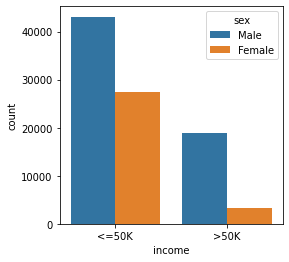

In [ ]:
plt.figure(figsize=(4,4))
sns.countplot(x='income', hue='sex', data=census2)

we can see the male ratio of earning is more than female.

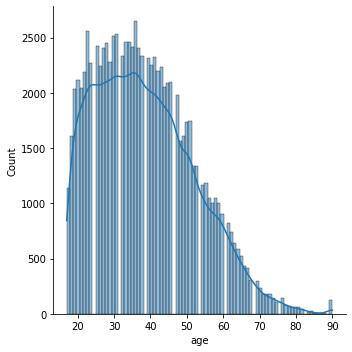

1503

In [ ]:
sns.displot(census2['age'],kde=True)
plt.show()
(census2.age>70).sum()

we can see the above graph is right skewed and data>70 is less person so not an issue

<Figure size 72x72 with 0 Axes>

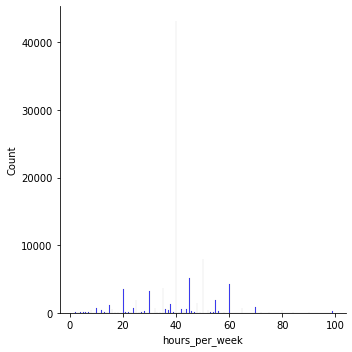

In [ ]:
plt.figure(figsize=(1,1))
sns.displot(census2['hours_per_week'],kde=False,color='b')
plt.show()

From the graph the value 45 that lie in the 3rd quartile so we can say 75% of people works between 40-45 hrs/week...

In [ ]:
census2.groupby(['workclass'])['income'].count().sort_values(ascending=False)

workclass
Private             64746
Self-emp-not-inc     7266
Local-gov            5903
?                    5070
State-gov            3663
Self-emp-inc         3149
Federal-gov          2704
Without-pay            38
Never-worked           22
Name: income, dtype: int64

The data is completely imbalance as majority people are working in private sector followed by self emp, private class working have highest number of people >50k

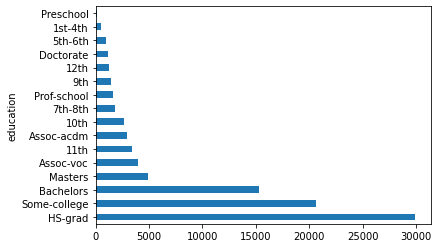

In [ ]:
#Higher secondary graduates and some college people are more into earning and contribution towards the target variable income
census2.groupby(['education'])['income'].count().sort_values(ascending=False).plot.barh()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



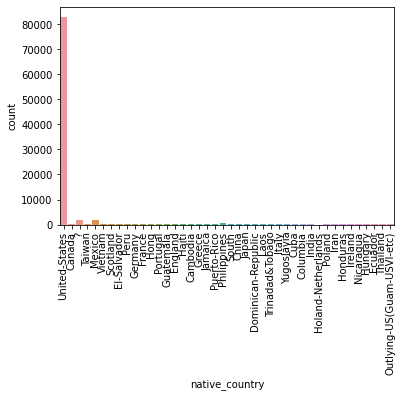

In [ ]:
sns.countplot(census2['native_country'])
plt.xticks(rotation=90)
plt.show()
###we can see United States have highest frequency that means data is of country US

###DATA PREPROCESSING

In [ ]:
from pyspark.ml.feature import StringIndexer, VectorAssembler, OneHotEncoder
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier,NaiveBayes, DecisionTreeClassifier, GBTClassifier

In [ ]:
## Spark unable to convert into a specific type, it returns a null value thats why PySpark SQL
#takes the different syntax DOUBLE(String column) to cast types.String to double
cast=['age','fnlwgt','education_num','capital_gain','capital_loss','hours_per_week']
for col in cast:
    census_df = census1.withColumn(col, census1[col].cast("double"))

In [ ]:
#The indices are in [0, numLabels) in StringIndexer
StringIndexer_workclass = StringIndexer(inputCol="workclass",outputCol="workclass_ind")
StringIndexer_education = StringIndexer(inputCol="education",outputCol="education_ind")
StringIndexer_marital_status = StringIndexer(inputCol="marital_status",outputCol="marital_status_ind")
StringIndexer_occupation = StringIndexer(inputCol="occupation",outputCol="occupation_ind")
StringIndexer_relationship = StringIndexer(inputCol="relationship",outputCol="relationship_ind")
StringIndexer_race = StringIndexer(inputCol="race",outputCol="race_ind")
StringIndexer_sex = StringIndexer(inputCol="sex",outputCol="sex_ind")
StringIndexer_native_country = StringIndexer(inputCol="native_country",outputCol="native_country_ind")
StringIndexer_income = StringIndexer(inputCol="income",outputCol="label")

In [ ]:
#converting a variable into numbers
OneHotEncoder_workclass = OneHotEncoder(inputCol="workclass_ind",outputCol="workclass_feat")
OneHotEncoder_education = OneHotEncoder(inputCol="education_ind",outputCol="education_feat")
OneHotEncoder_marital_status = OneHotEncoder(inputCol="marital_status_ind",outputCol="marital_status_feat")
OneHotEncoder_occupation = OneHotEncoder(inputCol="occupation_ind",outputCol="occupation_feat")
OneHotEncoder_relationship = OneHotEncoder(inputCol="relationship_ind",outputCol="relationship_feat")
OneHotEncoder_race = OneHotEncoder(inputCol="race_ind",outputCol="race_feat")
OneHotEncoder_sex = OneHotEncoder(inputCol="sex_ind",outputCol="sex_feat")
OneHotEncoder_native_country = OneHotEncoder(inputCol="native_country_ind",outputCol="native_country_feat")

vectorAssembler-Vector assembler's job is to combine the raw features and features generated from various transforms into a single feature vector

In [ ]:
assemble_columns = ['age', 'workclass_feat', 'fnlwgt', 'education_feat', 'education_num', 'marital_status_feat', 'occupation_feat', 'relationship_feat', 'race_feat', 'sex_feat', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country_feat']
assemble_features = VectorAssembler(inputCols=assemble_columns, outputCol='features')

usage of pipeline:ML API uses DataFrame from Spark SQL as an ML dataset, which can hold a variety of data types where  machine learning algorithms to make it easier to combine multiple algorithms into a single pipeline, or workflow

In [ ]:
from pyspark.ml import Pipeline
pipeline = Pipeline(stages=[])
basePipeline=[StringIndexer_workclass,StringIndexer_education,StringIndexer_marital_status,StringIndexer_occupation,StringIndexer_relationship,StringIndexer_race,StringIndexer_sex,StringIndexer_native_country,StringIndexer_income,OneHotEncoder_workclass,OneHotEncoder_education,OneHotEncoder_marital_status,OneHotEncoder_occupation,OneHotEncoder_relationship,OneHotEncoder_race,OneHotEncoder_sex,OneHotEncoder_native_country,assemble_features]

In [ ]:
train, test = census1.randomSplit([0.8,0.2],seed=11)

In [ ]:
#Models
log_reg = LogisticRegression()
pl_log_reg = Pipeline(stages = basePipeline+[log_reg])

nb = NaiveBayes()
pl_nb = Pipeline(stages = basePipeline+[nb])

rfc = RandomForestClassifier()
pl_rfc= Pipeline(stages = basePipeline+[rfc])

dt = DecisionTreeClassifier()
pl_dt = Pipeline(stages = basePipeline+[dt])

gbt = GBTClassifier()
pl_gbt = Pipeline(stages = basePipeline +[gbt])

In [ ]:
print({'Train_data_count':train.count()})
print({'Test_data_count':test.count()})


{'Train_data_count': 73962}
{'Test_data_count': 18599}


In [ ]:
print({'train_set_length':len(train.columns)})
print({'test_set_length':len(test.columns)})


{'train_set_length': 15}
{'test_set_length': 15}


In [ ]:
train.select('income').groupby('income').count().show()
test.select('income').groupby('income').count().show()


+------+-----+
|income|count|
+------+-----+
| <=50K|56260|
|  >50K|17702|
+------+-----+

+------+-----+
|income|count|
+------+-----+
| <=50K|14148|
|  >50K| 4451|
+------+-----+



In [ ]:
log_reg_model=pl_log_reg.fit(train)

nb_model = pl_nb.fit(train)

rfc_model = pl_rfc.fit(train)

dt_model = pl_dt.fit(train)

gbt_model = pl_gbt.fit(train)

In [ ]:
log_reg_pred=log_reg_model.transform(test)

nb_pred = nb_model.transform(test)

rfc_pred = rfc_model.transform(test)

dt_pred = dt_model.transform(test)

gbt_pred = gbt_model.transform(test)

In [ ]:
evaluator = BinaryClassificationEvaluator()

In [ ]:
evaluator.getMetricName()

'areaUnderROC'

In [ ]:
auroc = evaluator.evaluate(log_reg_pred, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC Curve for Logistic Regression: {:.4f}".format(auroc))

Area under ROC Curve for Logistic Regression: 0.9128


In [ ]:
auroc = evaluator.evaluate(nb_pred, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC Curve for Naivye Baye: {:.4f}".format(auroc))

Area under ROC Curve for Naivye Baye: 0.3598


In [ ]:
auroc = evaluator.evaluate(rfc_pred, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC Curve for Random Forest: {:.4f}".format(auroc))

Area under ROC Curve for Random Forest: 0.8932


In [ ]:
auroc = evaluator.evaluate(dt_pred, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC Curve for Decsion Tree: {:.4f}".format(auroc))

Area under ROC Curve for Decsion Tree: 0.7023


In [ ]:
auroc = evaluator.evaluate(gbt_pred, {evaluator.metricName: "areaUnderROC"})
print("Area under ROC Curve for Gradient Boosted Tree : {:.4f}".format(auroc))

Area under ROC Curve for Gradient Boosted Tree : 0.9172


In [ ]:
correct = log_reg_pred.where("(label = prediction)").count()
incorrect = log_reg_pred.where("(label != prediction)").count()
resultDF = spark.createDataFrame([['correct', correct], ['incorrect', incorrect]], ['metric', 'value'])
resultDF.show()
log=round(evaluator.evaluate(log_reg_pred),5)*100
print("Logistic Regression",log)

+---------+-----+
|   metric|value|
+---------+-----+
|  correct|15934|
|incorrect| 2665|
+---------+-----+

Logistic Regression 91.281


In [ ]:
correct = nb_pred.where("(label = prediction)").count()
incorrect = nb_pred.where("(label != prediction)").count()
resultDF = spark.createDataFrame([['correct', correct], ['incorrect', incorrect]], ['metric', 'value'])
resultDF.show()
print("Naive Bayes accuracy is "+ str((correct*100)/(correct+incorrect))+"%" )

+---------+-----+
|   metric|value|
+---------+-----+
|  correct|14612|
|incorrect| 3987|
+---------+-----+

Naive Bayes accuracy is 78.56336362170009%


In [ ]:
correct = rfc_pred.where("(label = prediction)").count()
incorrect = rfc_pred.where("(label != prediction)").count()
resultDF = spark.createDataFrame([['correct', correct], ['incorrect', incorrect]], ['metric', 'value'])
resultDF.show()
rf=round(evaluator.evaluate(rfc_pred),5)*100
print("Random Forest",rf)

+---------+-----+
|   metric|value|
+---------+-----+
|  correct|15578|
|incorrect| 3021|
+---------+-----+

Random Forest 89.31700000000001


In [ ]:
correct = dt_pred.where("(label = prediction)").count()
incorrect = dt_pred.where("(label != prediction)").count()
resultDF = spark.createDataFrame([['correct', correct], ['incorrect', incorrect]], ['metric', 'value'])
resultDF.show()
dt=round(evaluator.evaluate(dt_pred),5)*100
print("Decision Tree",dt)

+---------+-----+
|   metric|value|
+---------+-----+
|  correct|15708|
|incorrect| 2891|
+---------+-----+

Decision Tree 70.22500000000001


In [ ]:
correct = gbt_pred.where("(label = prediction)").count()
incorrect = gbt_pred.where("(label != prediction)").count()
resultDF = spark.createDataFrame([['correct', correct], ['incorrect', incorrect]], ['metric', 'value'])
resultDF.show()
gbt=round(evaluator.evaluate(gbt_pred),5)*100
print("Gradient Boosting Tree",gbt)

+---------+-----+
|   metric|value|
+---------+-----+
|  correct|15991|
|incorrect| 2608|
+---------+-----+

Gradient Boosting Tree 91.717


In [ ]:
counts = [gbt_pred.where('label=1').count(),gbt_pred.where('prediction=1').count
(),
gbt_pred.where('label=0').count(), gbt_pred.where('prediction=0').count
()]
names = ['actual 1', 'predicted 1', 'actual 0', 'predicted 0']
spark.createDataFrame(zip(names,counts),['Measure','Value']).show()

+-----------+-----+
|    Measure|Value|
+-----------+-----+
|   actual 1| 4451|
|predicted 1| 3365|
|   actual 0|14148|
|predicted 0|15234|
+-----------+-----+



Conclusion:As after comparing all the models our logistic and Gradient Boosted Tree give us the almost similar accuracy,though as per the value Gradient Boosted Tree give us the accuracy about 91.71 which is equivalent to 92% so hence we avoid cross validation Technique hence it might give us overfit model.

Receiver Operator Characteristics(ROC) of Gradient Boosted Algorithm will be considered as per the accuracy  and our value for roc curve is 0.91 which is a very good score, which is a plot of the True Positive Rate vs False Positive Rate 